In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.stats.multitest import fdrcorrection
import os
import datetime
print(datetime.datetime.now().strftime('%Y-%m-%d'))

import sys
sys.path.append('/data100t1/home/wanying/lab_code/utils')
from volcano_plot import volcano_plot
from QQplot_v6 import qqplot

2024-07-10


# 1. Get covariates and traits

In [37]:
fn_lip = '../inputs/lipid_species.with_covar_pcair_pc.log2.csv'
df_data = pd.read_csv(fn_lip)
df_data['constant'] = 1 # Need constent column for statsmodels.api
df_data.head()

fn_peer = '/data100t1/home/wanying/CCHC/lipidomics/20240529_differential_abandance/supporting_files/PEER_log2_lipid_species.csv'
df_peer = pd.read_csv(fn_peer)
# df_peer

cols_to_load = ['LABID', 'ADA2010_Cat', 'TE_kPa', 'TE_CAP_Med', 'FAST_Score', 'agile3',
                'agile4', 'CREA', 'BUN', 'CKD_EPI_GFR_Calc', 'APRI', 'FIB4_U']
fn_pheno = '/data100t1/share/CCHC/phenotypes/0424/cchc_phenotypes_0424.txt'
df_pheno = pd.read_csv(fn_pheno, sep='|', dtype=str)[cols_to_load]
# df_pheno = pd.read_csv(fn_pheno, sep='|', dtype=str)

df_data_merged = df_pheno.merge(df_data, on='LABID')
df_data_merged = df_peer.merge(df_data_merged, on=['RRID', 'LABID'])
# df_data_merged.to_csv('/data100t1/home/wanying/CCHC/lipidomics/20240529_differential_abandance/inputs/lipid_species.pheno.with_covar_pcair_pc.log2.csv',
#                       index=False)

# 2. Run OLS

In [38]:
df = pd.read_csv('/data100t1/home/wanying/CCHC/lipidomics/20240529_differential_abandance/inputs/lipid_species.pheno.with_covar_pcair_pc.log2.csv')
print(df.shape)

# Add random values for comparison purpose
df['random values'] = np.random.random(size=len(df))
df.head()

(2287, 912)


,RRID,LABID,PEER1,PEER2,PEER3,PEER4,PEER5,PEER6,PEER7,PEER8,...,CE(18:2) [+OH],CE(20:4) [+OH],LPC(18:2) [+OH],LPC(20:4) [+OH],LPC(22:6) [+OH],PC(34:2) [+OH],PC(36:4) [+OH],PC(38:6) [+OH],constant,random values
0,BD0009,10Y0308,0.020681,0.060194,0.443331,0.168561,-0.166004,0.184441,0.179063,1.457041,...,13.413229,10.540556,4.515043,4.940075,2.640661,3.992902,6.219821,3.904186,1,0.038832
1,BD0010,10Y0021,0.021379,0.048425,0.244377,0.160938,0.151945,-0.178879,-0.746028,-0.214458,...,12.689138,10.536003,5.289073,6.079794,4.101318,4.150397,6.951989,4.482243,1,0.035718
2,BD0058,10Y0246,0.021934,0.010561,0.377723,-0.254966,-0.476799,0.254842,-0.049682,-0.411354,...,13.407831,10.897769,5.167331,6.663608,4.921179,3.144100,6.892447,4.212189,1,0.776165
3,BD0231,10Y0261,0.021242,-0.049194,0.312903,-0.159521,-0.866211,0.518006,-1.219119,0.448116,...,12.112998,9.829458,3.004321,3.976089,2.257964,3.405186,7.054885,4.547050,1,0.093410
4,BD0237,10Y0245,0.021963,-0.009423,0.232245,0.129996,0.372601,0.506988,-1.185085,-0.650632,...,13.700127,10.547562,4.538970,5.612600,4.534694,5.389943,6.570995,4.816642,1,0.593659


In [40]:
df.columns[81:-2]

Index(['Sph(d18:1)', 'Sph(d18:2)', 'S1P(d16:1)', 'S1P(d18:0)', 'S1P(d18:1)',
       'S1P(d18:2)', 'dhCer(d18:0/16:0)', 'dhCer(d18:0/18:0)',
       'dhCer(d18:0/20:0)', 'dhCer(d18:0/22:0)',
       ...
       'TG(O-54:4) [NL-18:2]', 'Ubiquinone', 'CE(18:2) [+OH]',
       'CE(20:4) [+OH]', 'LPC(18:2) [+OH]', 'LPC(20:4) [+OH]',
       'LPC(22:6) [+OH]', 'PC(34:2) [+OH]', 'PC(36:4) [+OH]',
       'PC(38:6) [+OH]'],
      dtype='object', length=830)

In [41]:
def run_ols_and_plot(df, trait, n_pcs=3, n_peers=60):
    '''
    Params:
    - df: a dataframe of the results
    - trait: trait to run linear regression, such as liver trait, t2d, or even random values
    - n_pcs, n_peers: number of PCs and PEER factors to include as covariates
    '''
    targets = df.columns[81:-2]
    # trait = 'ADA2010_Cat'
    # trait = random values
    lipid_type = 'lip_species'
    # n_pcs, n_peers = 3, 60 # Number of PCs and PEER factors to use in the model
    output_fn = f'{trait}.{lipid_type}.sex_age_PC1-{n_pcs}_peer1-{n_peers}.txt'
    output_dir = '/data100t1/home/wanying/CCHC/lipidomics/20240529_differential_abandance/outputs'
    output_plot_fn_prefix = f'{output_dir}/{output_fn[:-4]}' # To save plots
    fh = open(f'{output_dir}/{output_fn}', 'w')
    fh.write('lipid\tpheno\tpval\tbeta\tstd\n')
    
    for i, target in enumerate(targets):
        covar_cols = [trait, 'AGE_AT_VISIT',
                      'GENDER', 'constant'] + [f'PC{x}' for x in range(1, n_pcs+1)] + [f'PEER{x}' for x in range(1, n_peers+1)]
        X = df[covar_cols]
        y = df[target]
        
        model = sm.OLS(y, X, missing='drop')
        results = model.fit()
        
        pval = results.pvalues[trait]
        beta = results.params[trait]
        std = results.bse[trait]
        
        line = f'{target}\t{trait}\t{pval}\t{beta}\t{std}\n'
        fh.write(line)
        print(f'\rProcess {trait} {n_peers} PEERs: {i}      ', end='', flush=True)
    print('\n# Number of samples into regression:', results.nobs)
    print('# DONE')
    fh.close()
    
   
    df_result = pd.read_csv(f'{output_dir}/{output_fn}', sep='\t')
    df_result['fdr_pval'] = fdrcorrection(df_result['pval'])[1]
    df_result.to_csv(f'{output_dir}/{output_fn}', index=False, sep='\t')
    # display(df_result.head())
    
    # Plot volcano plot
    f, a = volcano_plot(df=df_result, pval_col='pval', fc_col='beta',
                        log_fc=False, pval_threshold_col='fdr_pval', title=f'{trait} (N={int(results.nobs)})')
    f.savefig(output_plot_fn_prefix+'.volcano.png', format='png')
    
    # # Plot pvalues
    # fig, ax = plt.subplots()
    # ax.hist(df_result['pval'], rwidth=0.9, bins=20)
    # ax.set_title('p values')
    # fig.savefig(output_plot_fn_prefix+'.pval_hist.png', format='png')
    
    # qq plot
    f, a, _, _ = qqplot(filename=df_result, p_value_column_title='pval', title=trait)
    f.savefig(output_plot_fn_prefix+'.qqplot.png', format='png')

Process ADA2010_Cat 10 PEERs: 829      
# Number of samples into regression: 2248.0
# DONE
Process ADA2010_Cat 20 PEERs: 829      
# Number of samples into regression: 2248.0
# DONE
Process ADA2010_Cat 30 PEERs: 829      
# Number of samples into regression: 2248.0
# DONE
Process ADA2010_Cat 40 PEERs: 829      
# Number of samples into regression: 2248.0
# DONE
Process ADA2010_Cat 50 PEERs: 829      
# Number of samples into regression: 2248.0
# DONE
Process ADA2010_Cat 60 PEERs: 829      
# Number of samples into regression: 2248.0
# DONE
Process TE_kPa 10 PEERs: 829      
# Number of samples into regression: 364.0
# DONE
Process TE_kPa 20 PEERs: 829      
# Number of samples into regression: 364.0
# DONE
Process TE_kPa 30 PEERs: 829      
# Number of samples into regression: 364.0
# DONE
Process TE_kPa 40 PEERs: 829      
# Number of samples into regression: 364.0
# DONE
Process TE_kPa 50 PEERs: 829      
# Number of samples into regression: 364.0
# DONE


/data100t1/home/wanying/lab_code/utils/volcano_plot.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(5,5), dpi=150)


Process TE_kPa 60 PEERs: 829      
# Number of samples into regression: 364.0
# DONE
Process TE_CAP_Med 10 PEERs: 829      
# Number of samples into regression: 364.0
# DONE
Process TE_CAP_Med 20 PEERs: 829      
# Number of samples into regression: 364.0
# DONE
Process TE_CAP_Med 30 PEERs: 829      
# Number of samples into regression: 364.0
# DONE
Process TE_CAP_Med 40 PEERs: 829      
# Number of samples into regression: 364.0
# DONE
Process TE_CAP_Med 50 PEERs: 829      
# Number of samples into regression: 364.0
# DONE
Process TE_CAP_Med 60 PEERs: 829      
# Number of samples into regression: 364.0
# DONE
Process FAST_Score 10 PEERs: 829      
# Number of samples into regression: 351.0
# DONE
Process FAST_Score 20 PEERs: 829      
# Number of samples into regression: 351.0
# DONE
Process FAST_Score 30 PEERs: 829      
# Number of samples into regression: 351.0
# DONE
Process FAST_Score 40 PEERs: 829      
# Number of samples into regression: 351.0
# DONE
Process FAST_Score 50 PEE

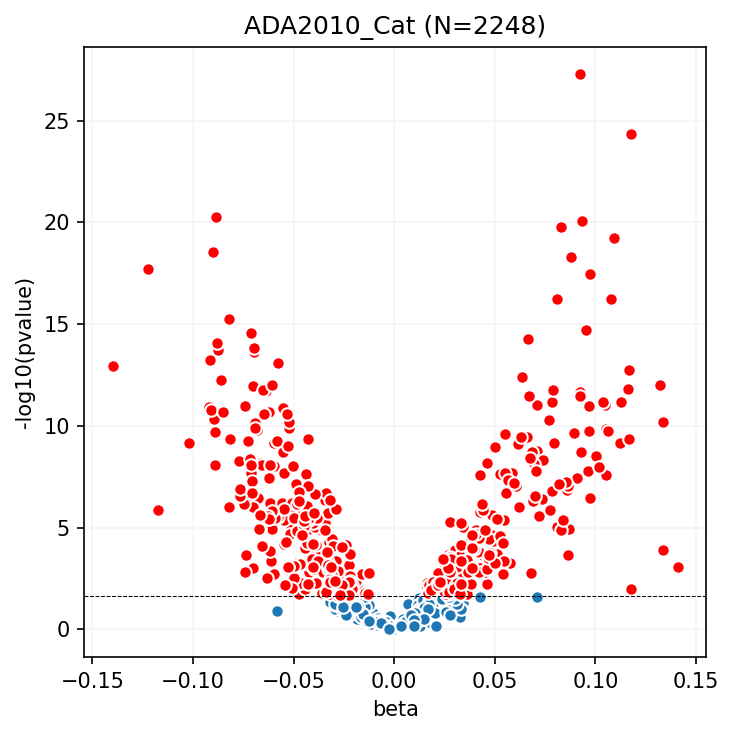

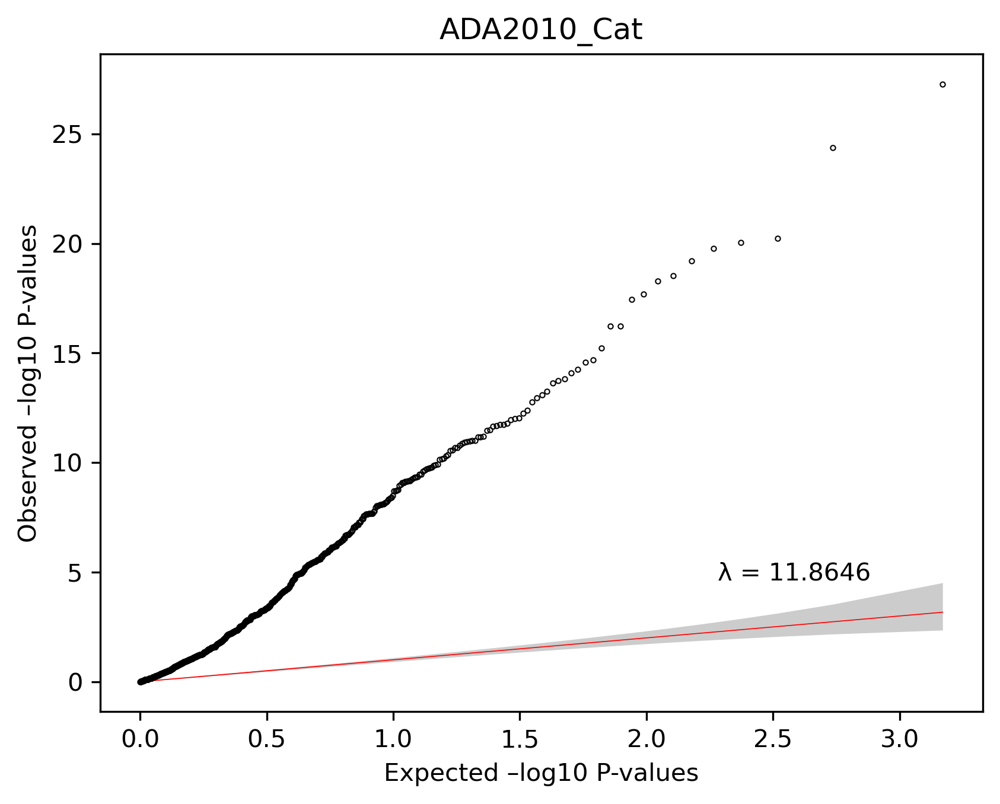

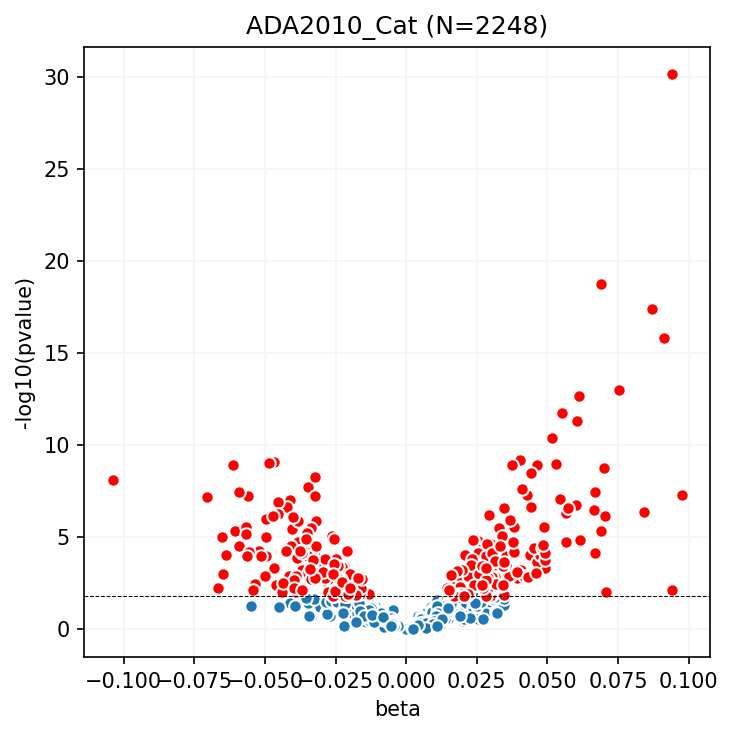

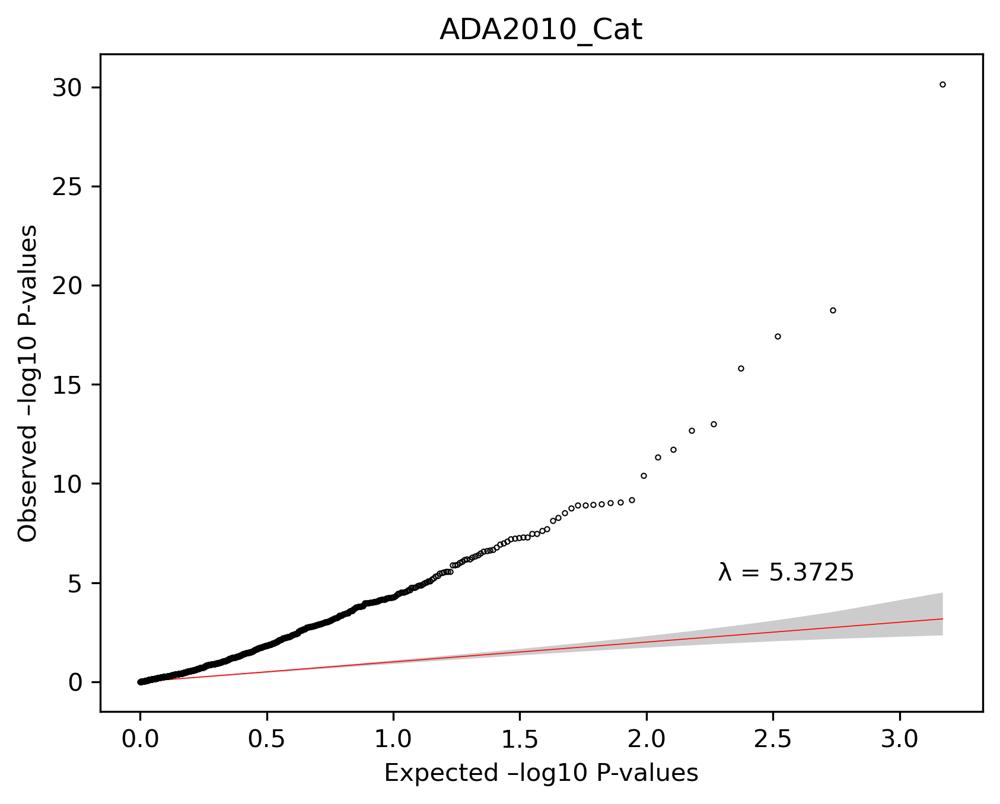

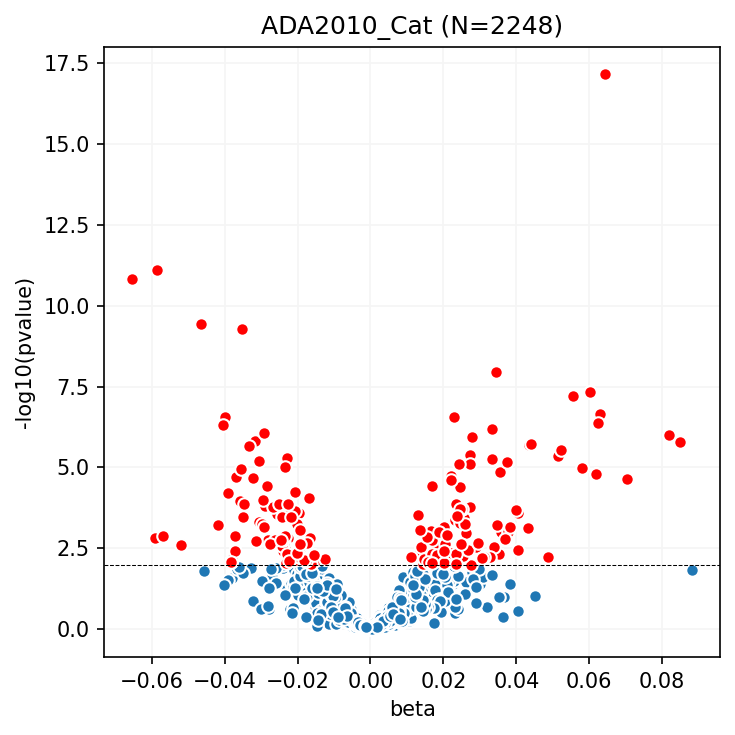

...

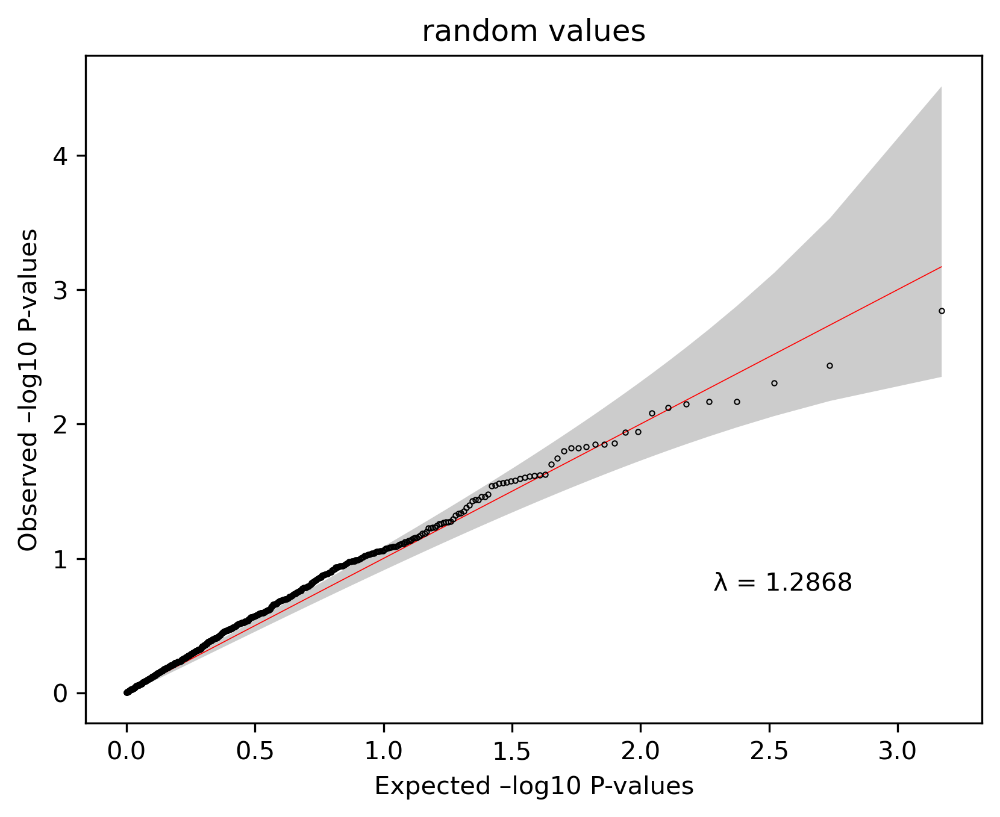

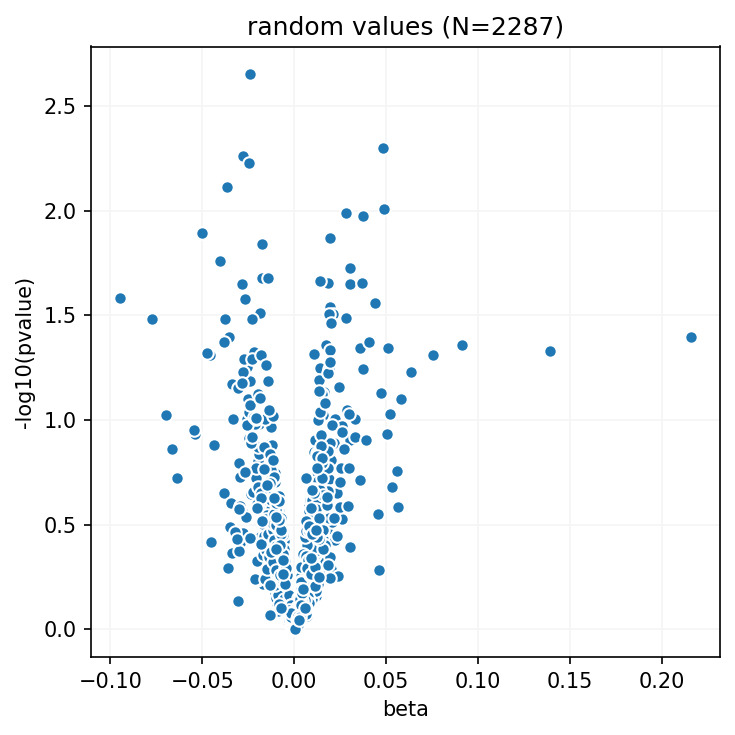

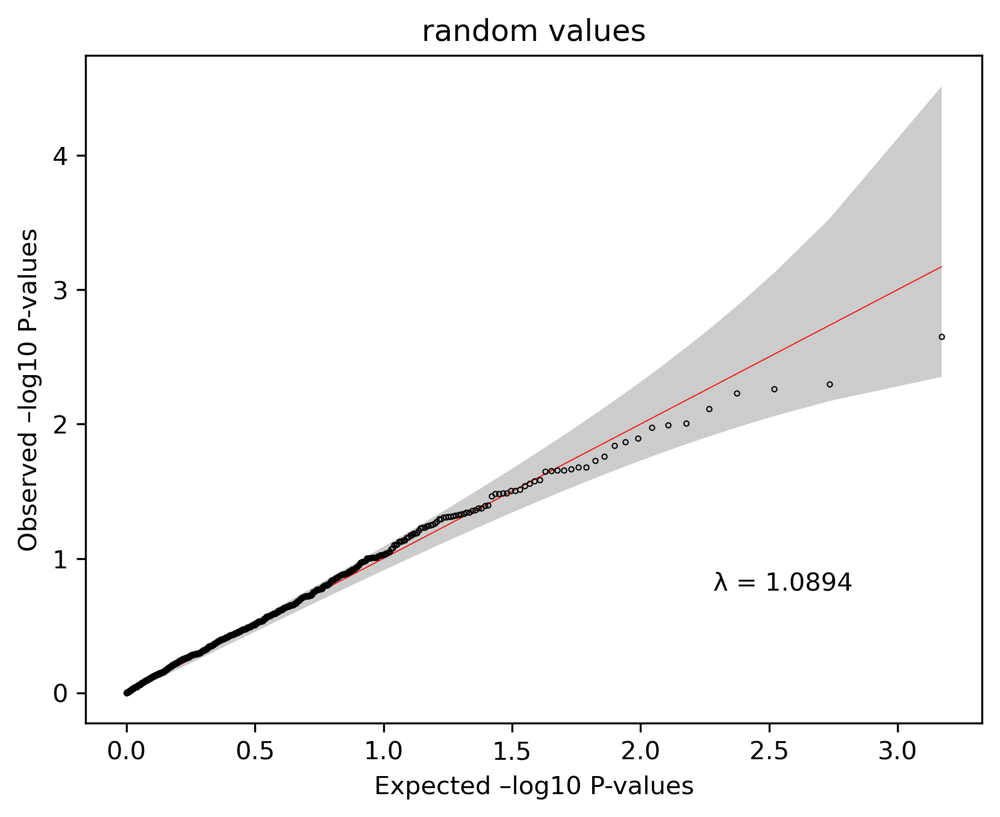

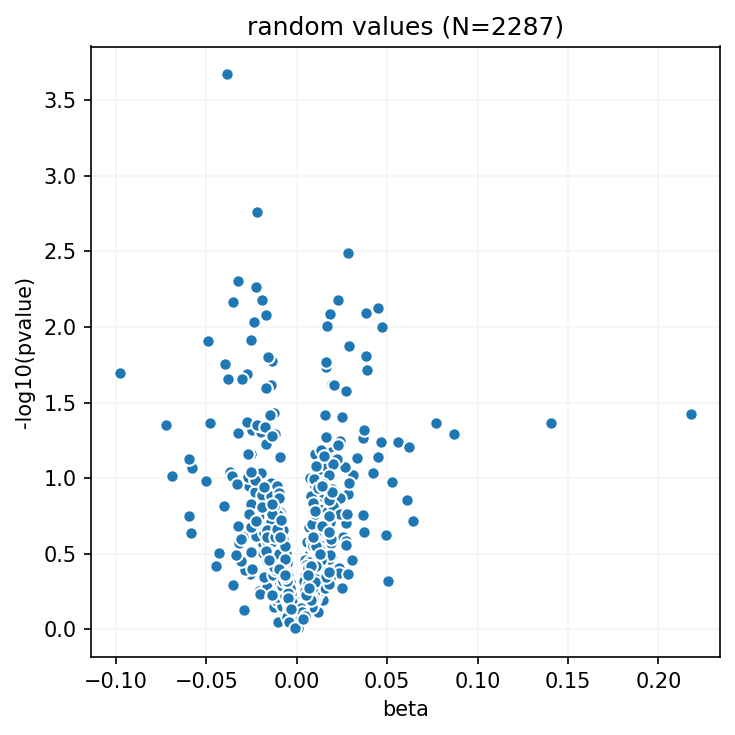

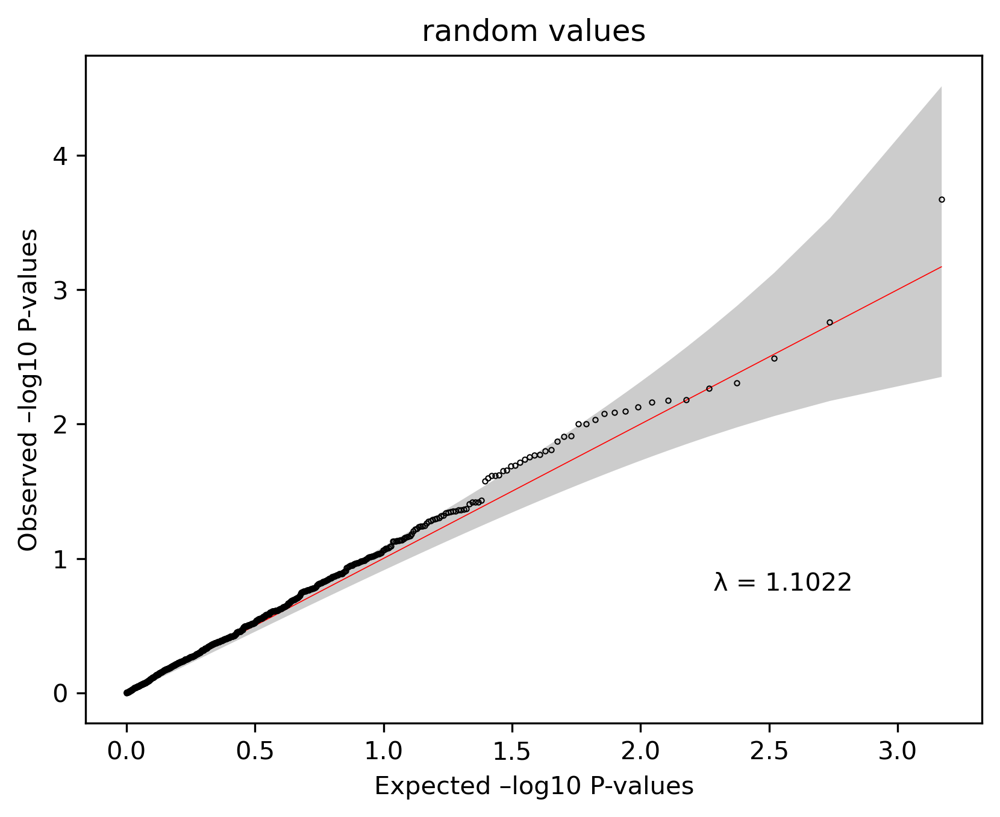

In [7]:
for t in ['ADA2010_Cat', 'TE_kPa', 'TE_CAP_Med', 'FAST_Score', 'agile3', 'agile4', 'random values']:
    for n_peers in [10, 20, 30, 40, 50, 60]:
        run_ols_and_plot(df=df, trait=t, n_pcs=3, n_peers=n_peers)

Process APRI 10 PEERs: 829      
# Number of samples into regression: 2259.0
# DONE
Process APRI 20 PEERs: 829      
# Number of samples into regression: 2259.0
# DONE
Process APRI 30 PEERs: 829      
# Number of samples into regression: 2259.0
# DONE
Process APRI 40 PEERs: 829      
# Number of samples into regression: 2259.0
# DONE
Process APRI 50 PEERs: 829      
# Number of samples into regression: 2259.0
# DONE
Process APRI 60 PEERs: 829      
# Number of samples into regression: 2259.0
# DONE
Process FIB4_U 10 PEERs: 829      
# Number of samples into regression: 2257.0
# DONE
Process FIB4_U 20 PEERs: 829      
# Number of samples into regression: 2257.0
# DONE
Process FIB4_U 30 PEERs: 829      
# Number of samples into regression: 2257.0
# DONE
Process FIB4_U 40 PEERs: 829      
# Number of samples into regression: 2257.0
# DONE
Process FIB4_U 50 PEERs: 829      
# Number of samples into regression: 2257.0
# DONE


/data100t1/home/wanying/lab_code/utils/volcano_plot.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(5,5), dpi=150)


Process FIB4_U 60 PEERs: 829      
# Number of samples into regression: 2257.0
# DONE


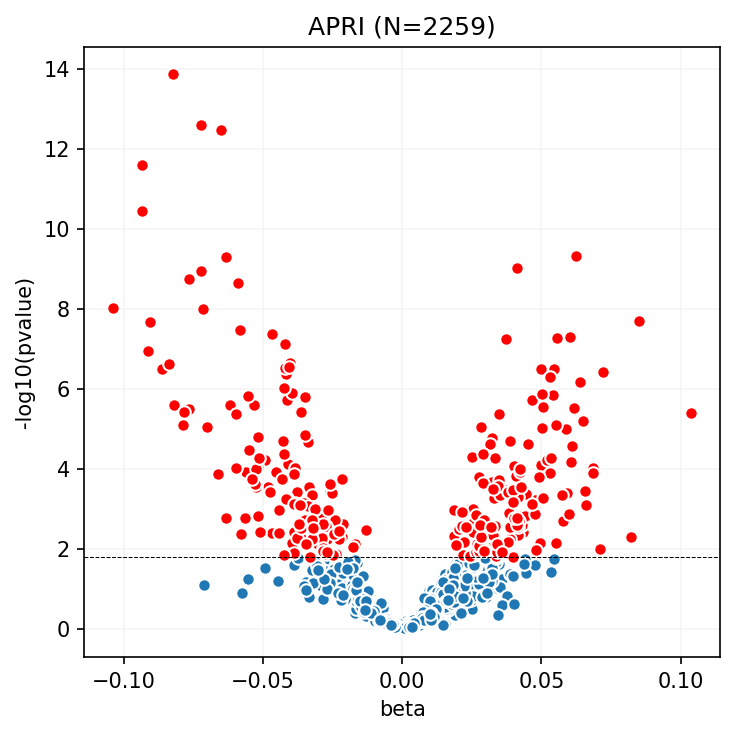

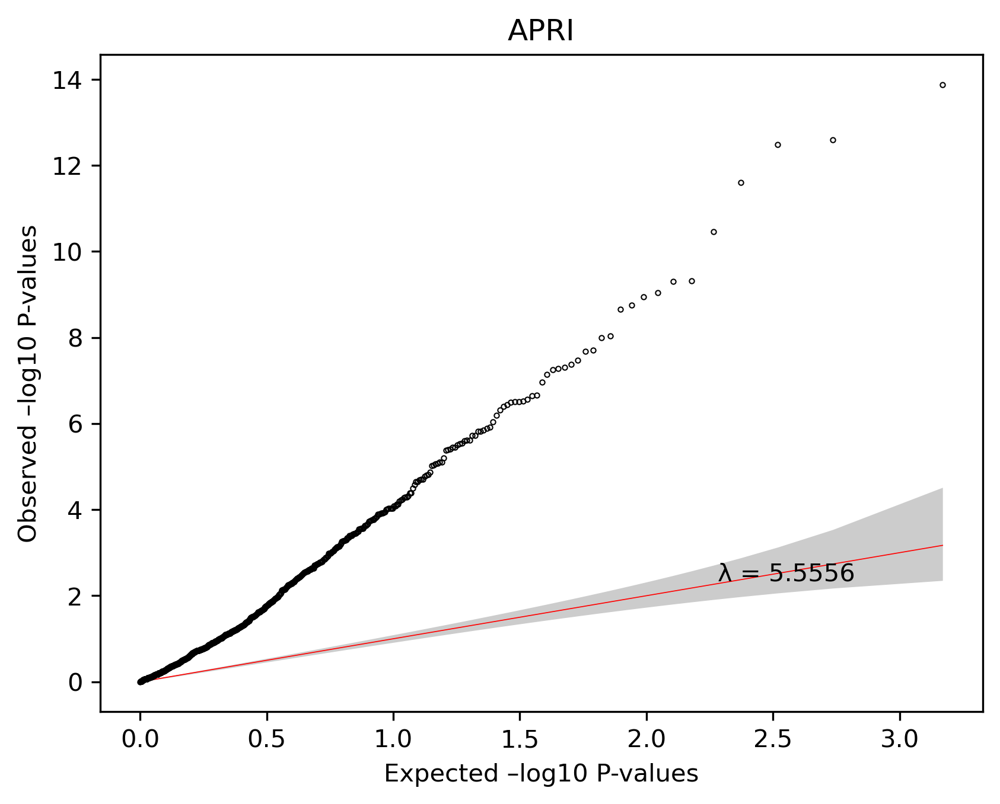

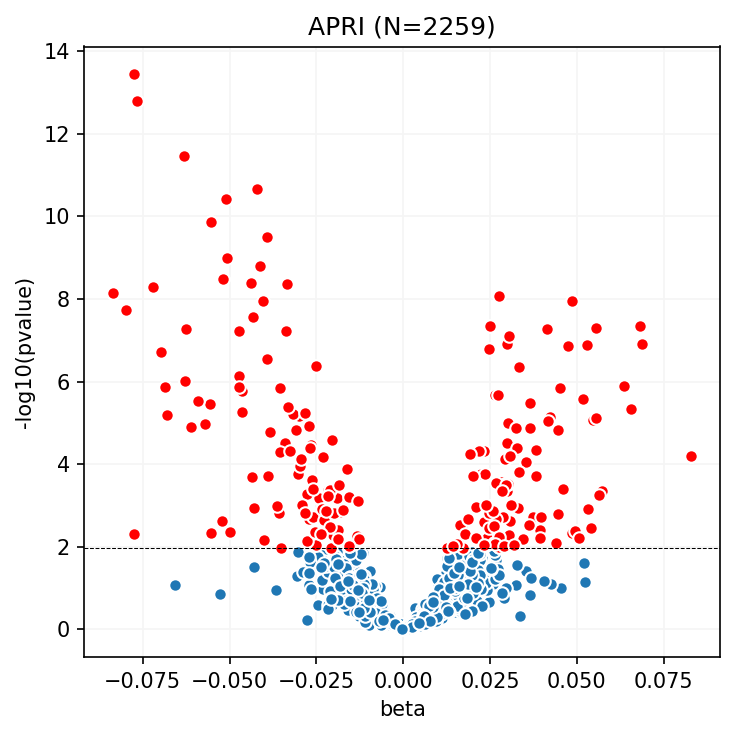

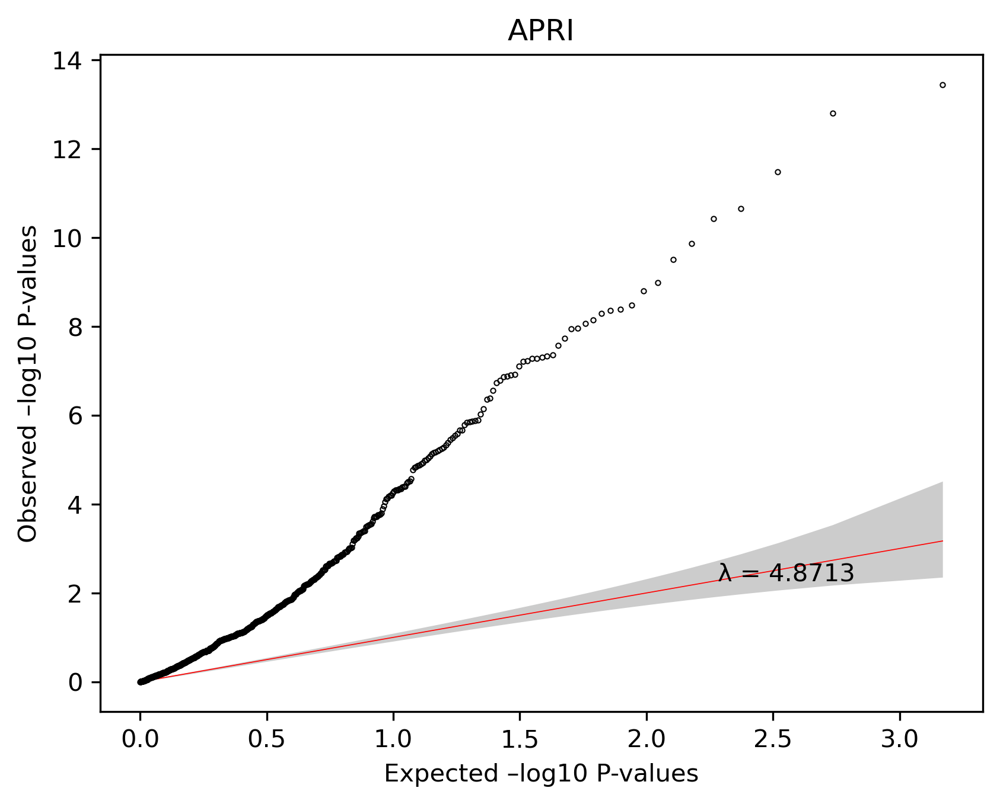

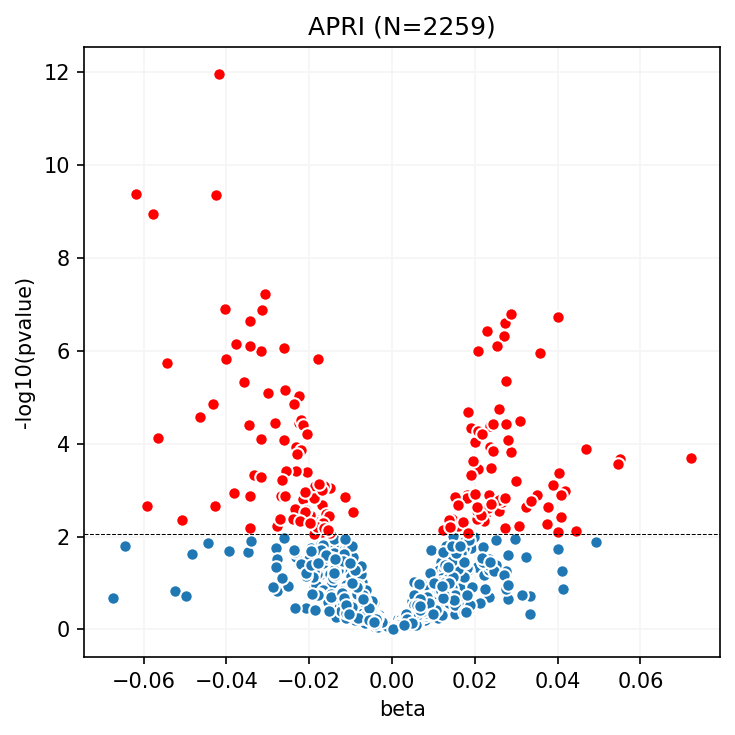

...

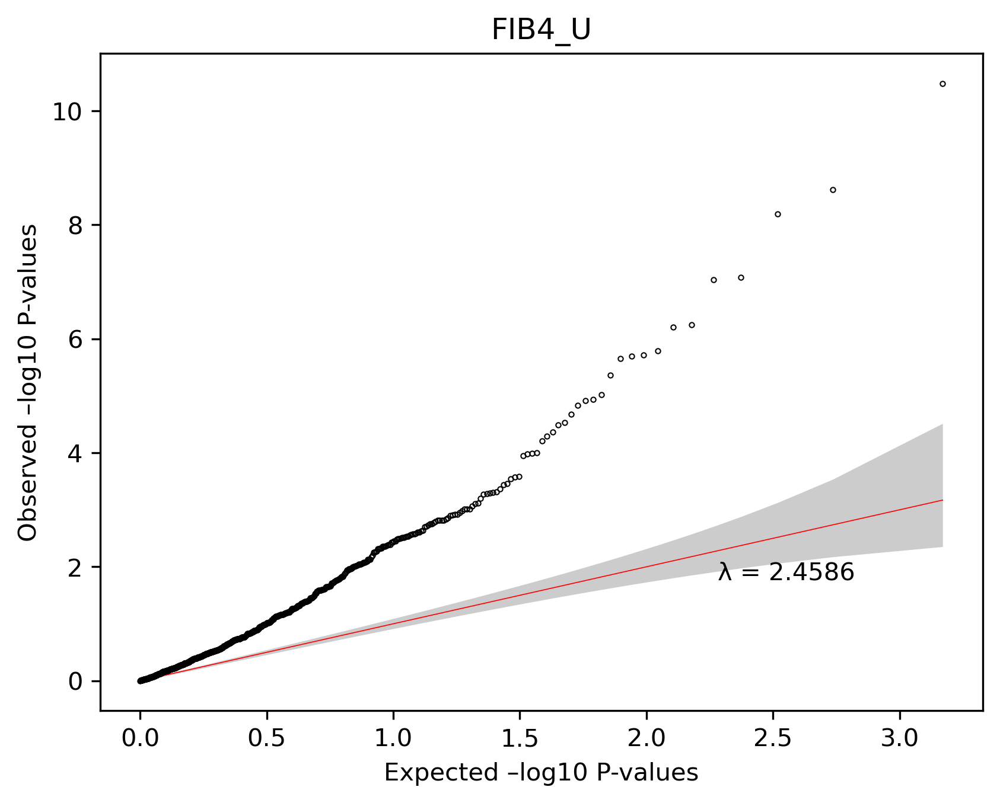

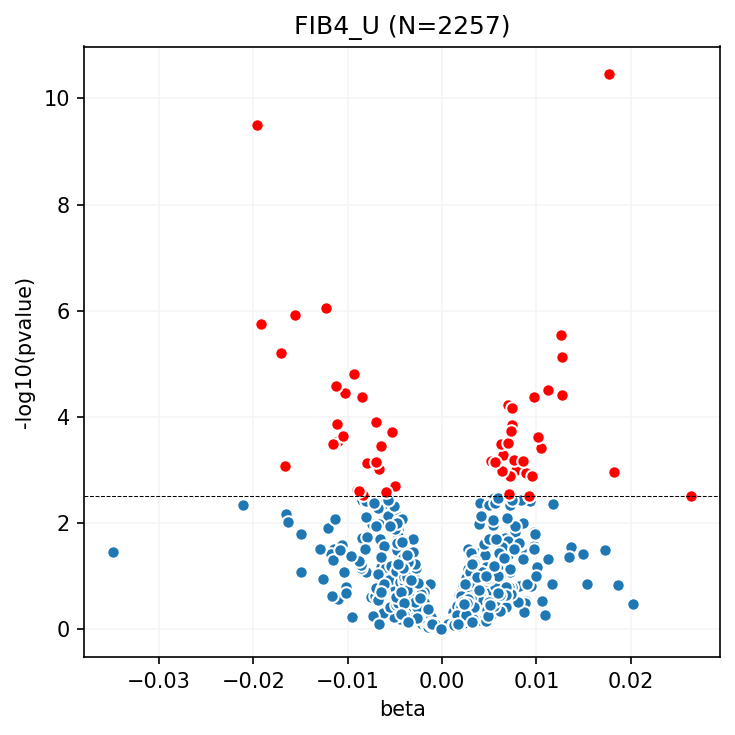

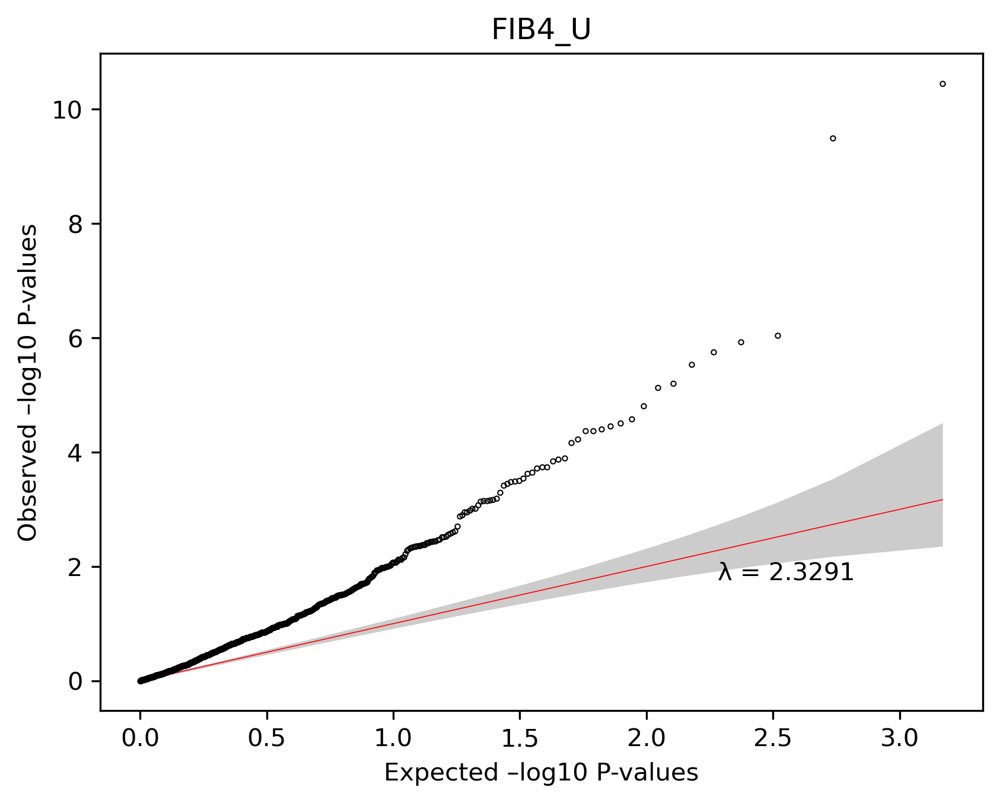

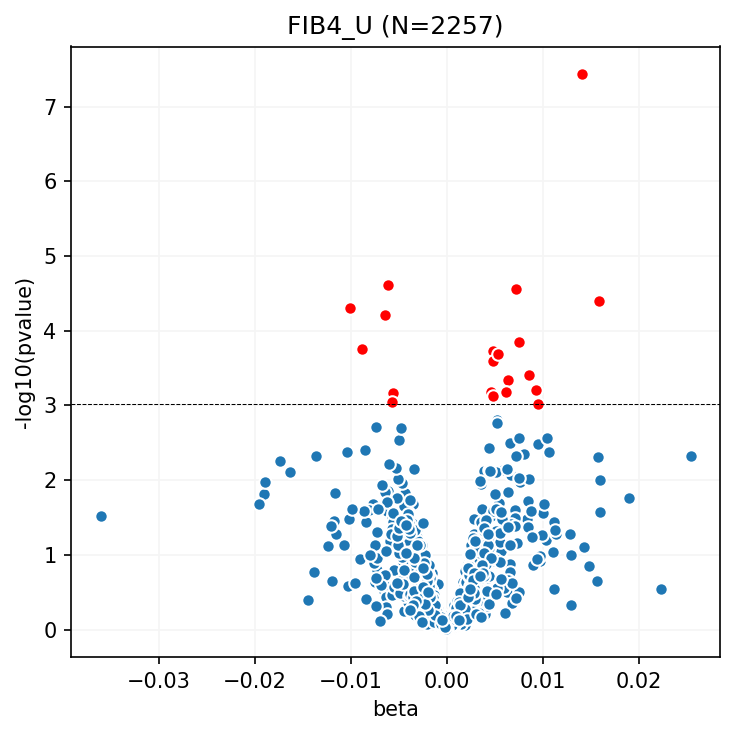

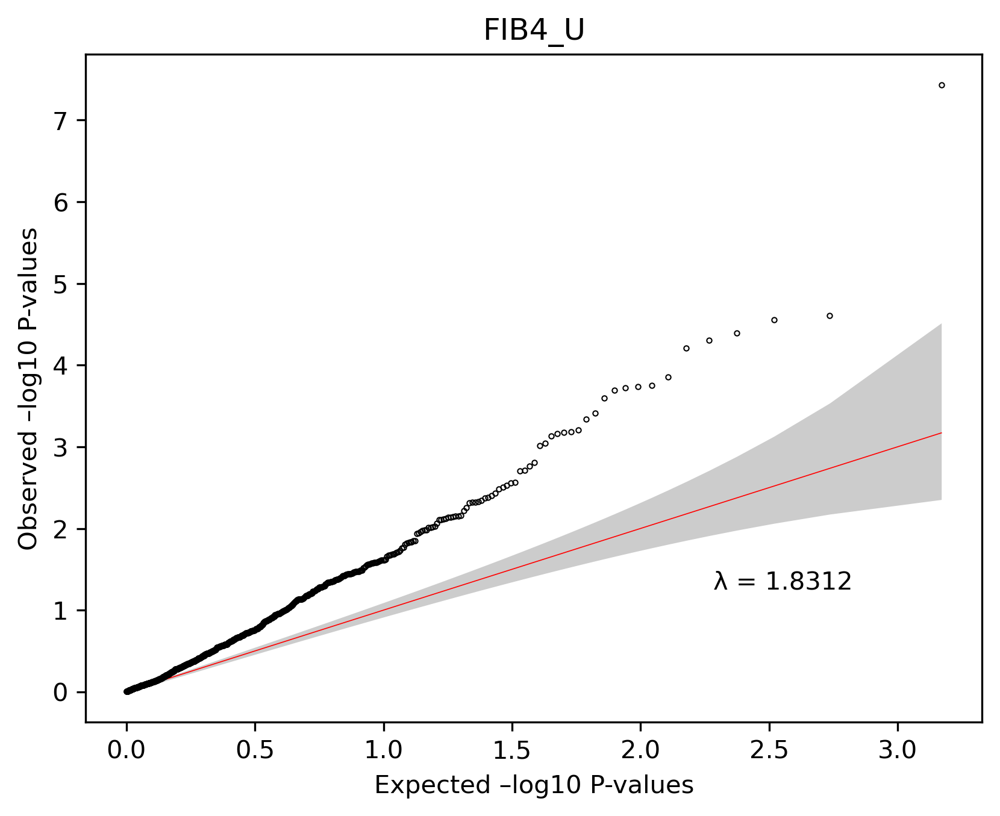

In [42]:
for t in ['APRI', 'FIB4_U']:
    for n_peers in [10, 20, 30, 40, 50, 60]:
        run_ols_and_plot(df=df, trait=t, n_pcs=3, n_peers=n_peers)

In [45]:
df['APRI'].isna().sum()

28